In [2]:
import tensorflow as tf
import os
import cv2
import shutil
import itertools
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import nibabel as nib
import seaborn as sns
from IPython.display import Image,display
from PIL import Image
from sklearn import preprocessing
from sklearn.preprocessing import LabelBinarizer
from tensorflow.keras import models, layers, optimizers
from sklearn.model_selection import train_test_split
from keras.models import Sequential
from keras.layers import MaxPooling2D
from tensorflow.keras.layers import Input, Lambda, Dense, Flatten,Conv2D, BatchNormalization, Activation,  Dropout, MaxPooling2D

from mpl_toolkits.axes_grid1 import ImageGrid
import matplotlib.gridspec as gridspec
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix, ConfusionMatrixDisplay
from sklearn.metrics import roc_curve, auc, roc_auc_score
from itertools import cycle


from tensorflow.keras.models import Model
from keras.applications.vgg19 import VGG19
from keras.applications.vgg19 import preprocess_input
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras import models, layers, optimizers
from tensorflow.keras.layers import BatchNormalization, Activation
from tensorflow.keras.applications import VGG19
import matplotlib.pyplot as plt
import sklearn.metrics as sklearn_metrics
import time

from tensorflow.keras.optimizers import  SGD, Adam, RMSprop
from tensorflow.keras.callbacks import ReduceLROnPlateau, EarlyStopping, TensorBoard, ModelCheckpoint, LearningRateScheduler
from tensorflow.keras.utils import plot_model
from mpl_toolkits.axes_grid1 import ImageGrid

from tensorflow.keras.utils import load_img
from tensorflow.keras.preprocessing import image
from tensorflow.keras.layers import RandomRotation
from tensorflow.keras.layers import RandomContrast
from tensorflow.keras.layers import RandomZoom
from tensorflow.keras.layers import RandomFlip
from tensorflow.keras.layers import RandomTranslation

from glob import glob

import plotly.graph_objs as go
from plotly.offline import init_notebook_mode, iplot
from plotly import tools

print(f'Tensorflow Version: {tf.__version__}')

SEED = 111

# Data Visualization updates
%config InlineBackend.figure_format = 'retina'
plt.rcParams["figure.figsize"] = (16, 10)
plt.rcParams.update({'font.size': 14})

import warnings
warnings.filterwarnings("ignore", category=FutureWarning)

Tensorflow Version: 2.16.1


In [3]:
data_dir = ("C:\\Users\\22211\\Documents\\BT-dataset2\\MRI Image Dataset for Brain Tumor")
train_dir = os.path.join(data_dir, "Training")
test_dir = os.path.join(data_dir, "Testing")
valid_dir = os.path.join(data_dir, "Validation")

In [4]:
#Category name based on subclasses directory in dataset
CATEGORIES =["glioma", "meningioma", "notumor", "pituitary"]
NUM_OF_CATEGORIES = len(CATEGORIES)
NUM_OF_CATEGORIES

4

In [5]:
# Data Information

def data_information(sub_data_dir):
    for category in CATEGORIES:
        print('{} {} images'.format(category,len(os.listdir(os.path.join(sub_data_dir, category)))))

In [6]:
print("\n Training Dataset: \n")
data_information(train_dir)
print("\n Testing Dataset: \n")
data_information(test_dir)
print("\n Validation Dataset: \n")
data_information(valid_dir)



 Training Dataset: 

glioma 1321 images
meningioma 1338 images
notumor 1595 images
pituitary 1457 images

 Testing Dataset: 

glioma 300 images
meningioma 306 images
notumor 405 images
pituitary 300 images

 Validation Dataset: 

glioma 175 images
meningioma 139 images
notumor 162 images
pituitary 179 images


In [7]:
def data_preparation(data, subpath_dir, dataset_dir):
    data_list = []  # Use a different variable name to store collected information
    #tumor category
    for category_id, category in enumerate(CATEGORIES):
        #main_directory + category
        category_dir = os.path.join(dataset_dir, category)
        
        for file in os.listdir(category_dir):
            data_list.append([f'{data_dir}/{subpath_dir}/{category}/{file}', category_id, category])
    
    data = pd.DataFrame(data_list, columns=['file', 'category_id', 'category'])
    print(f'Shape of {subpath_dir} dataset: {data.shape}')
    return data

In [8]:
train = pd.DataFrame()
trainset = data_preparation(train, 'Training', train_dir)
trainset.head(2)

Shape of Training dataset: (5711, 3)


,file,category_id,category
0,C:\Users\22211\Documents\BT-dataset2\MRI Image...,0,glioma
1,C:\Users\22211\Documents\BT-dataset2\MRI Image...,0,glioma


In [9]:
trainset.iloc[0]['file']

'C:\\Users\\22211\\Documents\\BT-dataset2\\MRI Image Dataset for Brain Tumor/Training/glioma/Tr-glTr_0000.jpg'

In [10]:
test = pd.DataFrame()
testset = data_preparation(test, 'Testing', test_dir)
testset.head(2)

Shape of Testing dataset: (1311, 3)


,file,category_id,category
0,C:\Users\22211\Documents\BT-dataset2\MRI Image...,0,glioma
1,C:\Users\22211\Documents\BT-dataset2\MRI Image...,0,glioma


In [11]:
valid = pd.DataFrame()
validset = data_preparation(valid, 'Validation', valid_dir)
validset.head(2)

Shape of Validation dataset: (655, 3)


,file,category_id,category
0,C:\Users\22211\Documents\BT-dataset2\MRI Image...,0,glioma
1,C:\Users\22211\Documents\BT-dataset2\MRI Image...,0,glioma


In [12]:
trainset['category'].value_counts()

category
notumor       1595
pituitary     1457
meningioma    1338
glioma        1321
Name: count, dtype: int64

In [13]:
#category sampling
SAMPLE_PER_CATEGORIES = 1321
#reproducability
SEED =42
#image re-sizing
WIDTH = 150
HEIGHT =150
#No of channels
DEPTH = 3

INPUT_SHAPE = (WIDTH, HEIGHT, DEPTH)

In [14]:
training = trainset.copy()
training = pd.concat([training[training['category']==c][:SAMPLE_PER_CATEGORIES] for c in CATEGORIES])
training = training.sample(frac=1)
training.index = np.arange(len(training))
training.shape

(5284, 3)

In [15]:
training.head(10)

,file,category_id,category
0,C:\Users\22211\Documents\BT-dataset2\MRI Image...,0,glioma
1,C:\Users\22211\Documents\BT-dataset2\MRI Image...,2,notumor
2,C:\Users\22211\Documents\BT-dataset2\MRI Image...,1,meningioma
3,C:\Users\22211\Documents\BT-dataset2\MRI Image...,3,pituitary
4,C:\Users\22211\Documents\BT-dataset2\MRI Image...,0,glioma
5,C:\Users\22211\Documents\BT-dataset2\MRI Image...,2,notumor
6,C:\Users\22211\Documents\BT-dataset2\MRI Image...,2,notumor
7,C:\Users\22211\Documents\BT-dataset2\MRI Image...,3,pituitary
8,C:\Users\22211\Documents\BT-dataset2\MRI Image...,2,notumor
9,C:\Users\22211\Documents\BT-dataset2\MRI Image...,0,glioma


In [16]:
validing = validset.copy()
validing.head(5)

,file,category_id,category
0,C:\Users\22211\Documents\BT-dataset2\MRI Image...,0,glioma
1,C:\Users\22211\Documents\BT-dataset2\MRI Image...,0,glioma
2,C:\Users\22211\Documents\BT-dataset2\MRI Image...,0,glioma
3,C:\Users\22211\Documents\BT-dataset2\MRI Image...,0,glioma
4,C:\Users\22211\Documents\BT-dataset2\MRI Image...,0,glioma


In [17]:
testing = testset.copy()
testing.head(5)

,file,category_id,category
0,C:\Users\22211\Documents\BT-dataset2\MRI Image...,0,glioma
1,C:\Users\22211\Documents\BT-dataset2\MRI Image...,0,glioma
2,C:\Users\22211\Documents\BT-dataset2\MRI Image...,0,glioma
3,C:\Users\22211\Documents\BT-dataset2\MRI Image...,0,glioma
4,C:\Users\22211\Documents\BT-dataset2\MRI Image...,0,glioma


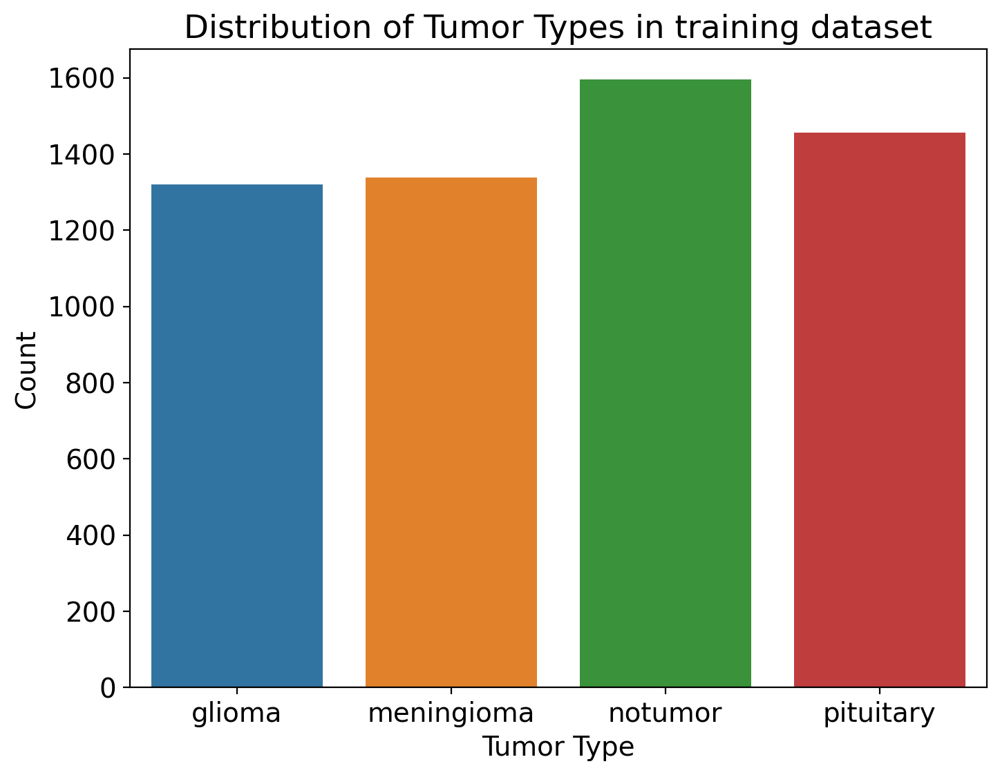

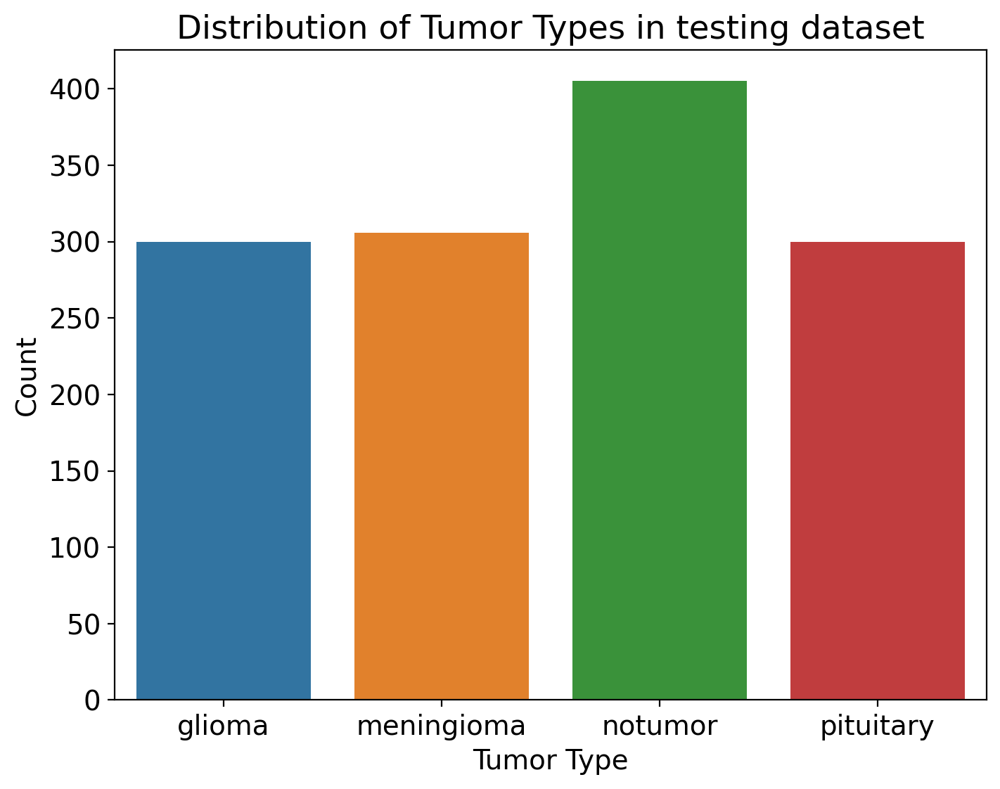

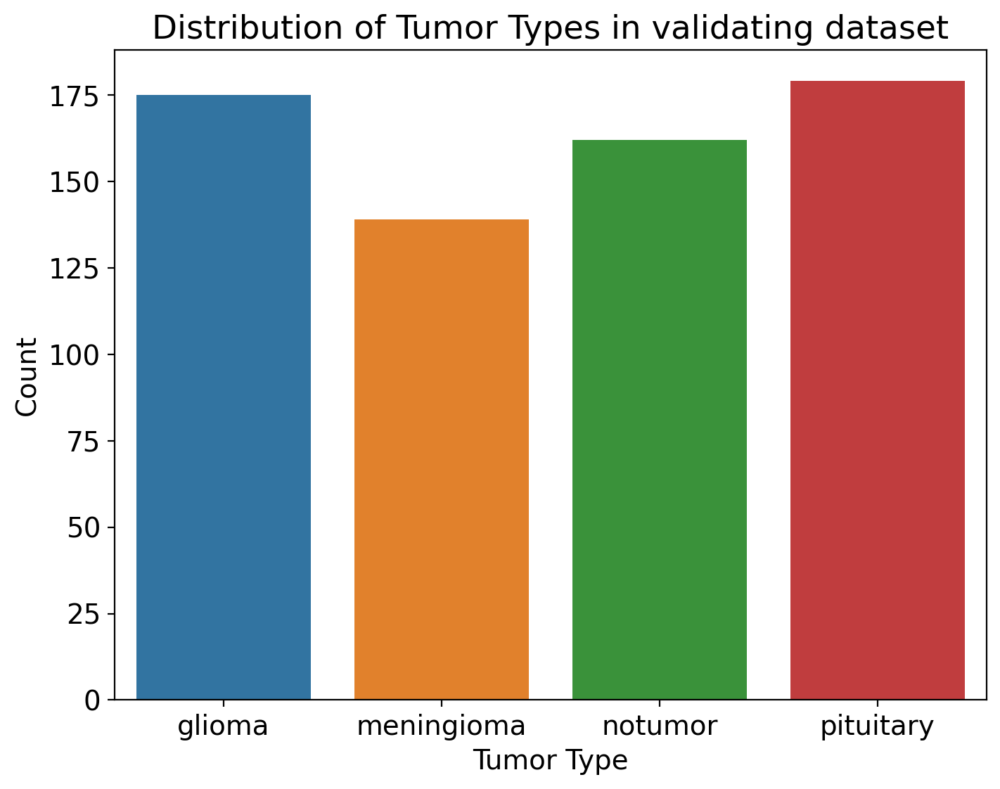

In [18]:
train_path='C:\\Users\\22211\\Documents\\BT-dataset2\\MRI Image Dataset for Brain Tumor\\Training'

# Load and preprocess the dataset
train_data = []
for category in CATEGORIES:
    folder_path = os.path.join(train_path, category)
    if os.path.exists(folder_path):  # Check if the folder exists before listing files
        images = os.listdir(folder_path)
        count = len(images)
        train_data.append(pd.DataFrame({"Image": images, "Category": [category] * count, "Count": [count] * count}))
    else:
        print(f"Folder not found: {folder_path}")

# Concatenate the dataframes
train_df = pd.concat(train_data, ignore_index=True)

# Visualize the distribution of tumor types in the training dataset
plt.figure(figsize=(8, 6))
sns.barplot(data=train_df, x="Category", y="Count")
plt.title("Distribution of Tumor Types in training dataset")
plt.xlabel("Tumor Type")
plt.ylabel("Count")
plt.show()


test_path='C:\\Users\\22211\\Documents\\BT-dataset2\\MRI Image Dataset for Brain Tumor\\Testing'

# Load and preprocess the dataset
test_data = []
for category in CATEGORIES:
    folder_path = os.path.join(test_path, category)
    images = os.listdir(folder_path)
    count = len(images)
    test_data.append(pd.DataFrame({"Image": images, "Category": [category] * count, "Count": [count] * count}))

test_df = pd.concat(test_data, ignore_index=True)


# Visualize the distribution of tumor types in the training dataset
plt.figure(figsize=(8, 6))
sns.barplot(data=test_df, x="Category", y="Count")
plt.title("Distribution of Tumor Types in testing dataset")
plt.xlabel("Tumor Type")
plt.ylabel("Count")
plt.show()


test_path='C:\\Users\\22211\\Documents\\BT-dataset2\\MRI Image Dataset for Brain Tumor\\Validation'

# Load and preprocess the dataset
test_data = []
for category in CATEGORIES:
    folder_path = os.path.join(test_path, category)
    images = os.listdir(folder_path)
    count = len(images)
    test_data.append(pd.DataFrame({"Image": images, "Category": [category] * count, "Count": [count] * count}))

test_df = pd.concat(test_data, ignore_index=True)


# Visualize the distribution of tumor types in the training dataset
plt.figure(figsize=(8, 6))
sns.barplot(data=test_df, x="Category", y="Count")
plt.title("Distribution of Tumor Types in validating dataset")
plt.xlabel("Tumor Type")
plt.ylabel("Count")
plt.show()

In [19]:
def read_img(filepath, size):
    img = image.load_img(filepath, target_size=size)
    img = image.img_to_array(img)
    return img

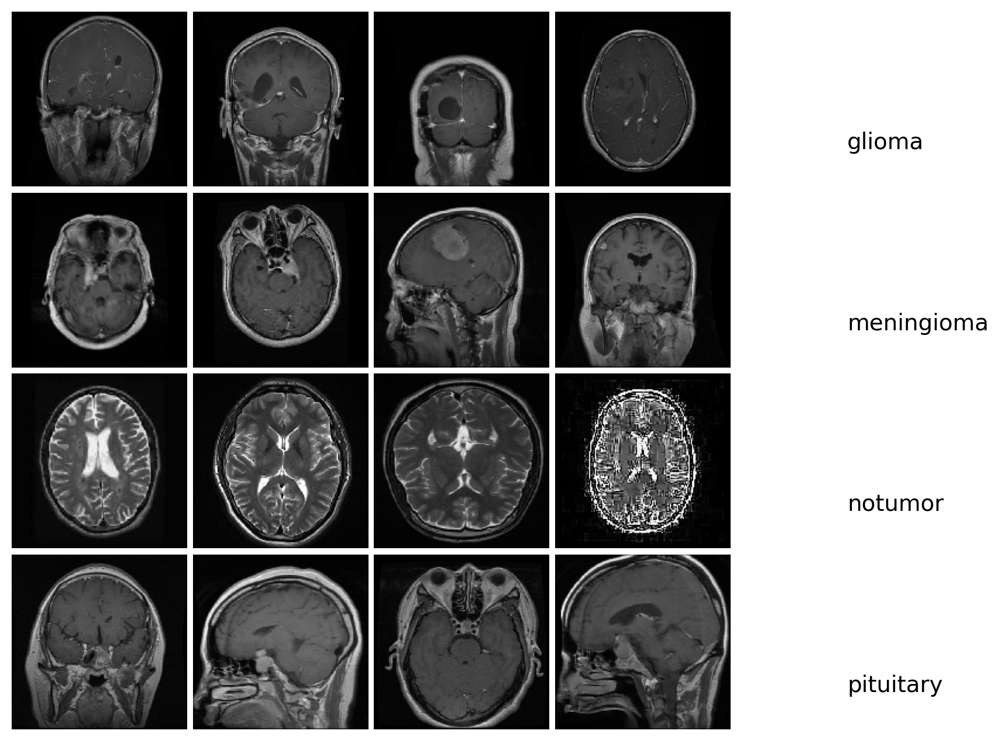

In [20]:
#training image data

fig = plt.figure(1, figsize=(8, 8))
grid = ImageGrid(fig, 111, nrows_ncols=(4, 4), axes_pad=0.05)
i = 0

for category_id, category in enumerate(CATEGORIES):
    for filepath in training[training['category'] == category]['file'].values[:NUM_OF_CATEGORIES]:
        ax = grid[i]
        img = read_img(filepath, (WIDTH, HEIGHT))
        ax.imshow(img / 255.0)
        ax.axis('off')
        if i % NUM_OF_CATEGORIES == NUM_OF_CATEGORIES - 1:
            ax.text(250, 112, filepath.split('/')[-2], verticalalignment='center')
        i += 1

plt.show()

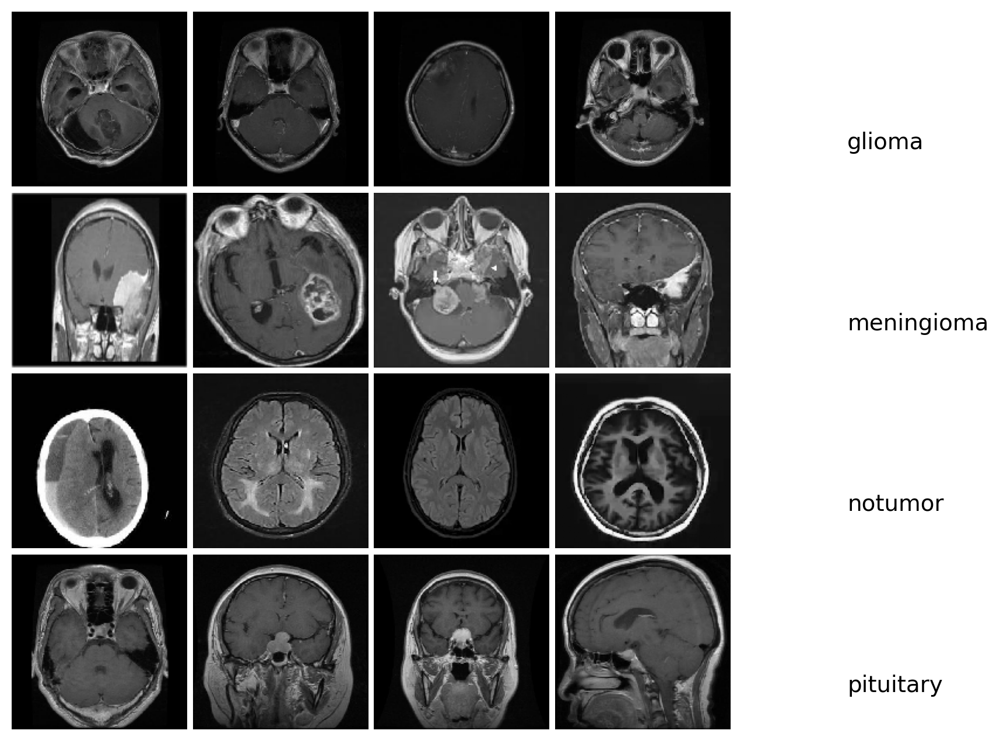

In [21]:
#testing image data

fig = plt.figure(1, figsize=(8,8))
#use of mpl ImageGrid toolkits for visualization
grid= ImageGrid(fig, 111, nrows_ncols=(4,4), axes_pad=0.05)
i=0
for category_id, category in enumerate(CATEGORIES):
    for filepath in testing[testing['category']== category]['file'].values[:NUM_OF_CATEGORIES]:
        ax = grid[i]
        img = read_img(filepath, (WIDTH,HEIGHT))
        ax.imshow(img/255.0)
        ax.axis('off')
        if i%NUM_OF_CATEGORIES == NUM_OF_CATEGORIES - 1:
            ax.text(250, 112, filepath.split('/')[-2], verticalalignment ='center')
        i+=1

plt.show() 

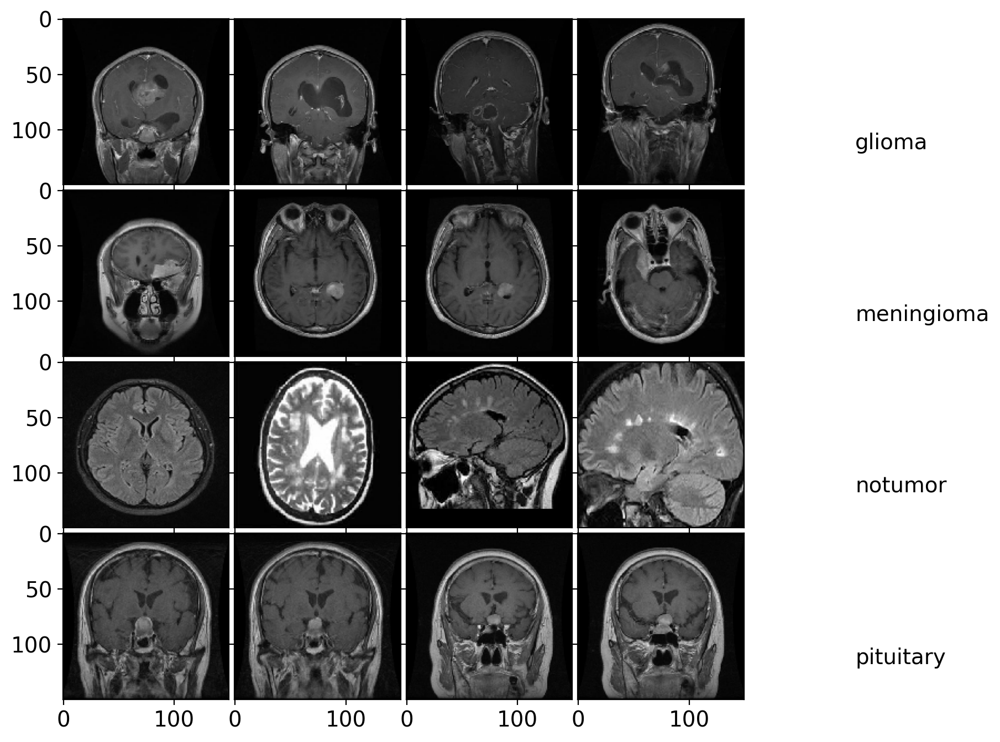

In [22]:
fig = plt.figure(1, figsize=(8,8))
#use of mpl ImageGrid toolkits for visualization
grid= ImageGrid(fig, 111, nrows_ncols=(4,4), axes_pad=0.05)
i=0
for category_id, category in enumerate(CATEGORIES):
    for filepath in validing[validing['category']== category]['file'].values[:NUM_OF_CATEGORIES]:
        ax = grid[i]
        img = read_img(filepath, (WIDTH,HEIGHT))
        ax.imshow(img/255.0)
        ax.axis('on')
        if i%NUM_OF_CATEGORIES == NUM_OF_CATEGORIES - 1:
            ax.text(250, 112, filepath.split('/')[-2], verticalalignment ='center')
        i+=1
    
plt.show() 

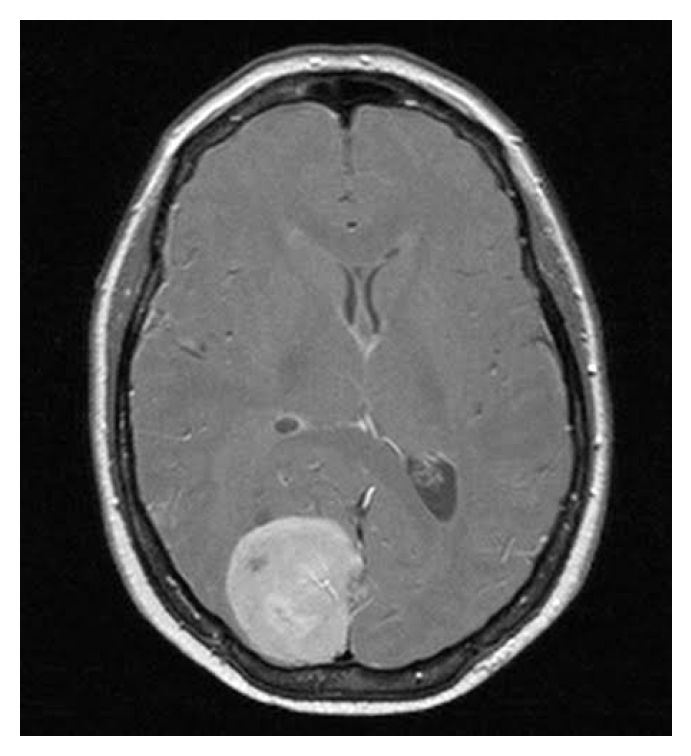

In [23]:
#import the image
img = cv2.imread('C:\\Users\\22211\\Documents\\BT-dataset2\\MRI Image Dataset for Brain Tumor\\Training\\meningioma\\Tr-me_0211.jpg',0)
plt.figure(figsize=(8, 4))
plt.imshow(img, cmap="gray")
plt.axis("off")
plt.tight_layout()
plt.show()

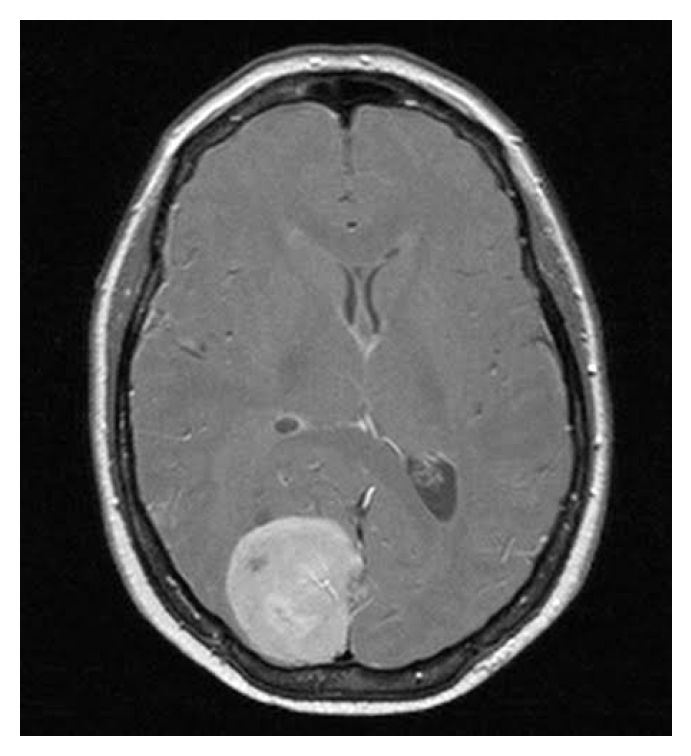

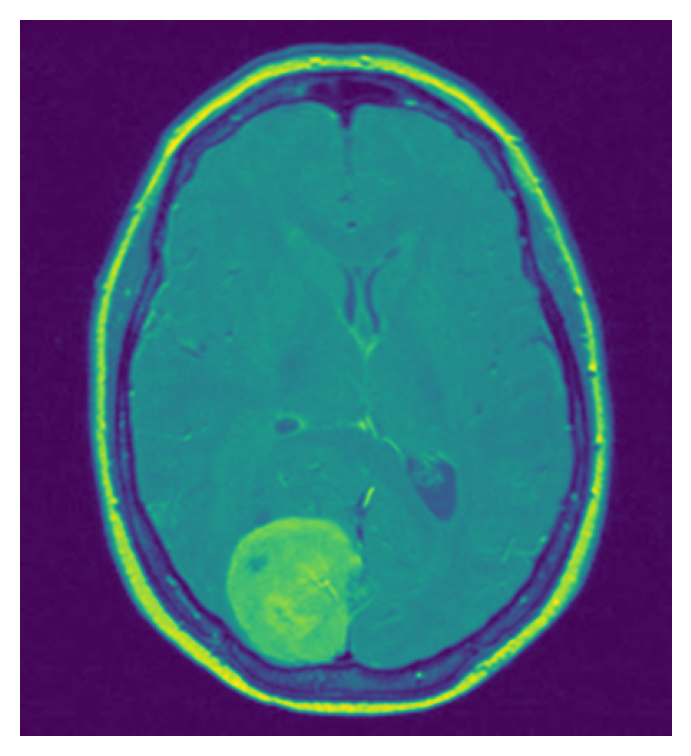

In [24]:
#denoising using gaussian filter
denoised_img = cv2.GaussianBlur(img, (5, 5), 0)
#median filter for smoothing
blured_image=cv2.medianBlur(denoised_img,1)
plt.figure(figsize=(8, 4))
plt.imshow(img,cmap='gray')
plt.axis("off")
plt.tight_layout()
plt.show()
plt.figure(figsize=(8, 4))
plt.imshow(blured_image)
plt.axis("off")
plt.tight_layout()
plt.show()

In [25]:
#initial mean ti
ti=np.mean(blured_image)
ti

75.41121758241758

In [26]:
#top pixel
flag=0
for i in range(blured_image.shape[0]):
    for j in range(blured_image.shape[1]):
        if blured_image[i][j]>ti:
            top=(i,j)
            flag=1
            break
    if flag==1:
        break

#bottom pixel
flag=0
for i in range((blured_image.shape[0]-1),0,-1):
    for j in range(blured_image.shape[1]):
        if blured_image[i][j]>ti:
            bottom=(i,j)
            flag=1
            break
    if flag==1:
        break

#left pixel
flag=0
for j in range(blured_image.shape[1]):
    for i in range(blured_image.shape[0]):
        if blured_image[i][j]>ti:
            left=(i,j)
            flag=1
            break
    if flag==1:
        break

#right pixel
flag=0
for j in range((blured_image.shape[1]-1),0,-1):
    for i in range(blured_image.shape[0]):
        if blured_image[i][j]>ti:
            right=(i,j)
            flag=1
            break
    if flag==1:
        break
    

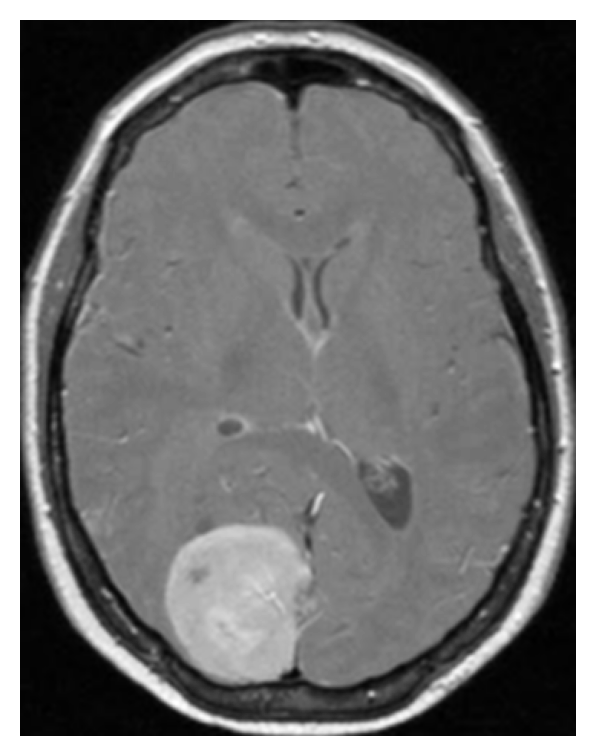

In [27]:
#cropped image
cropped_image=blured_image[top[0]:bottom[0],left[1]:right[1]]
plt.figure(figsize=(8, 4))
plt.imshow(cropped_image,cmap="gray")
plt.axis("off")
plt.tight_layout()
plt.show()

In [28]:
#final mean value tf
tf=np.mean(cropped_image)
tf

98.21224482588119

In [29]:
#extracting brain membrane region
br=[]
br=np.asarray(br)
for i in range(cropped_image.shape[0]):
    for j in range(cropped_image.shape[1]):
        if cropped_image[i][j]<tf:
            br=np.append(br,cropped_image[i][j])

In [30]:
#brain membraine mean intensity value T
t=np.mean(br)
t

32.31688690147214

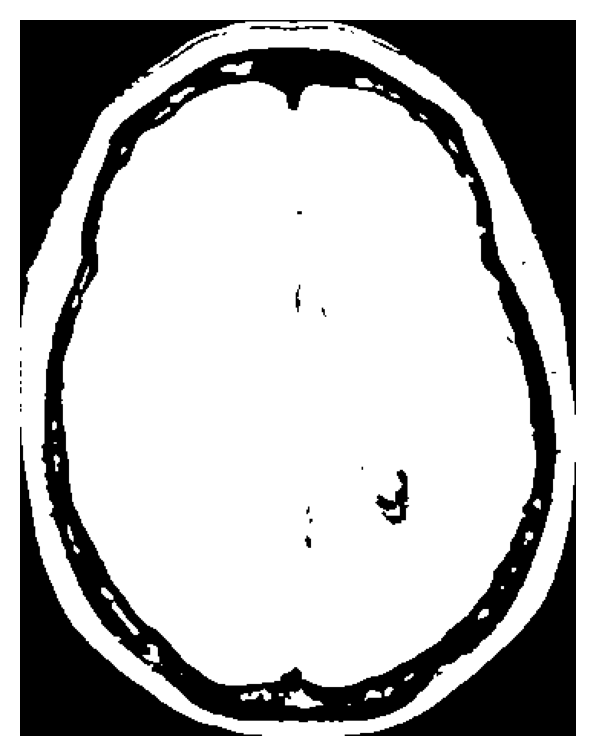

In [31]:
#Threshold the image to binary using Otsu's method
ret, thresh = cv2.threshold(cropped_image,0,255,cv2.THRESH_OTSU)

plt.figure(figsize=(8, 4))
plt.imshow(thresh, cmap="gray")
plt.axis("off")
plt.tight_layout()
plt.show()

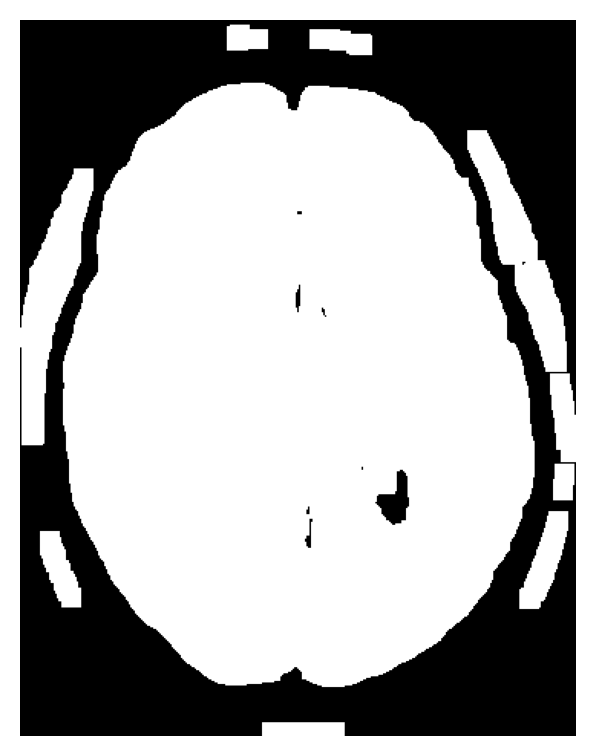

In [32]:
#opening
kernel=np.ones((13,13),np.uint8)*255
open_image=cv2.morphologyEx(thresh,cv2.MORPH_OPEN,kernel)
plt.figure(figsize=(8, 4))
plt.imshow(open_image, cmap="gray")
plt.axis("off")
plt.tight_layout()
plt.show()

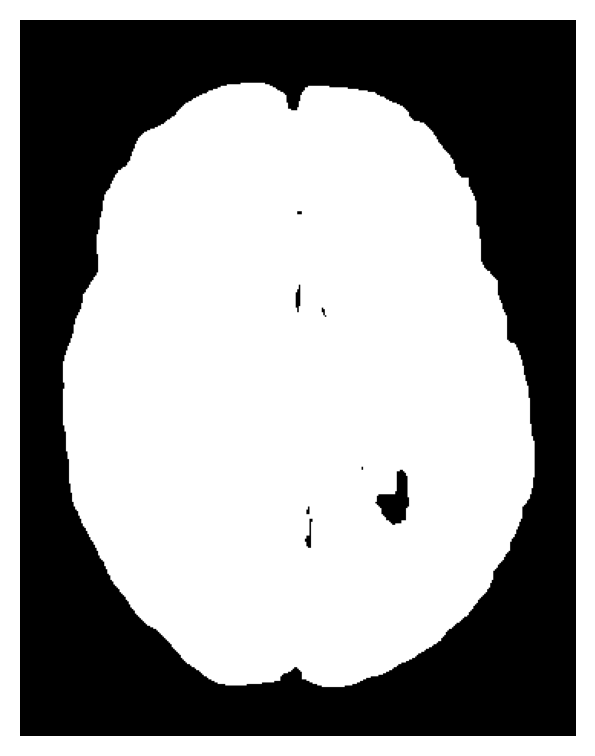

In [33]:
#largest Connected component
new_img = np.zeros_like(open_image)
for val in np.unique(open_image)[1:]:
    mask = np.uint8(open_image == val)
    labels, stats = cv2.connectedComponentsWithStats(mask, 4)[1:3]
    largest_label = 1 + np.argmax(stats[1:, cv2.CC_STAT_AREA])
    new_img[labels == largest_label] = val

plt.figure(figsize=(8, 4))
plt.imshow(new_img, cmap="gray")
plt.axis("off")
plt.tight_layout()
plt.show()

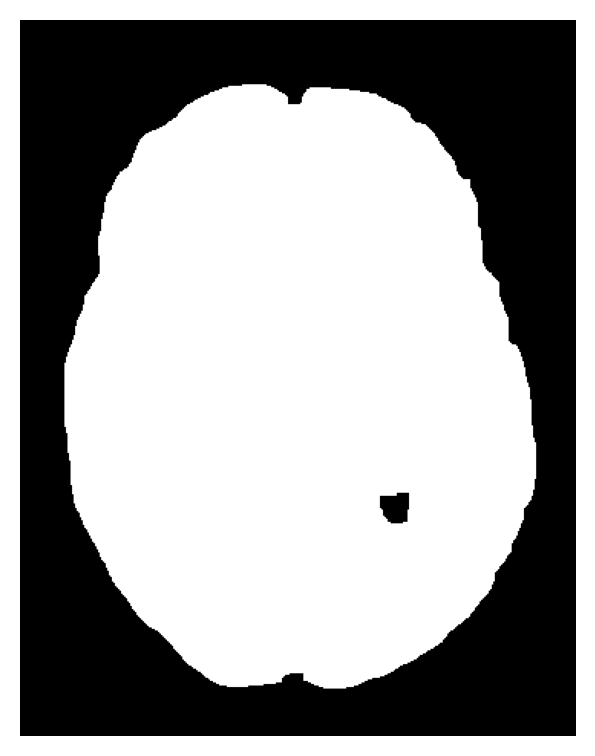

In [34]:
#closing image
new_img = np.uint8(new_img)
kernel1=np.ones((8,8),np.uint8)
close_image=cv2.morphologyEx(new_img,cv2.MORPH_CLOSE,kernel1)
plt.figure(figsize=(8, 4))
plt.imshow(close_image, cmap="gray")
plt.axis("off")
plt.tight_layout()
plt.show()

In [35]:
#mapping the 'image after closing' to the 'cropped image' to get the final resulting image
brain_image=np.zeros_like(cropped_image).astype(np.uint8)
for i in range(cropped_image.shape[0]):
    for j in range(cropped_image.shape[1]):
        if close_image[i][j]==255:
            brain_image[i][j]=cropped_image[i][j]

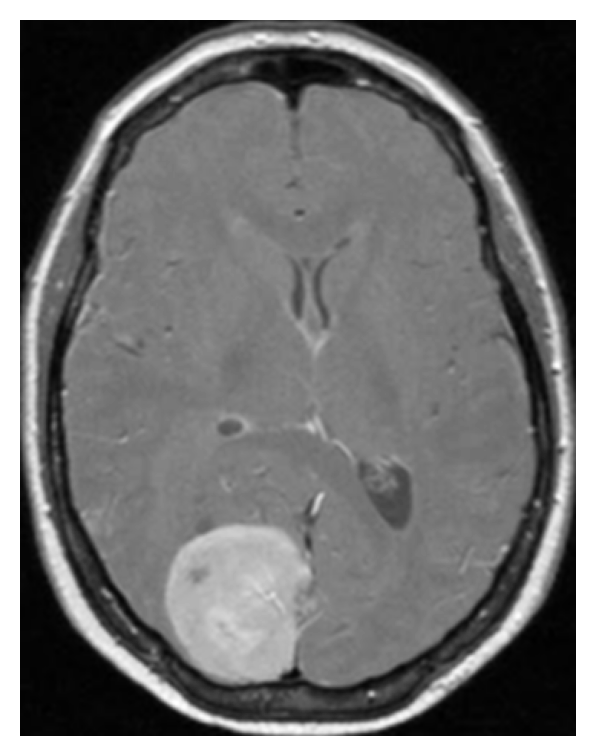

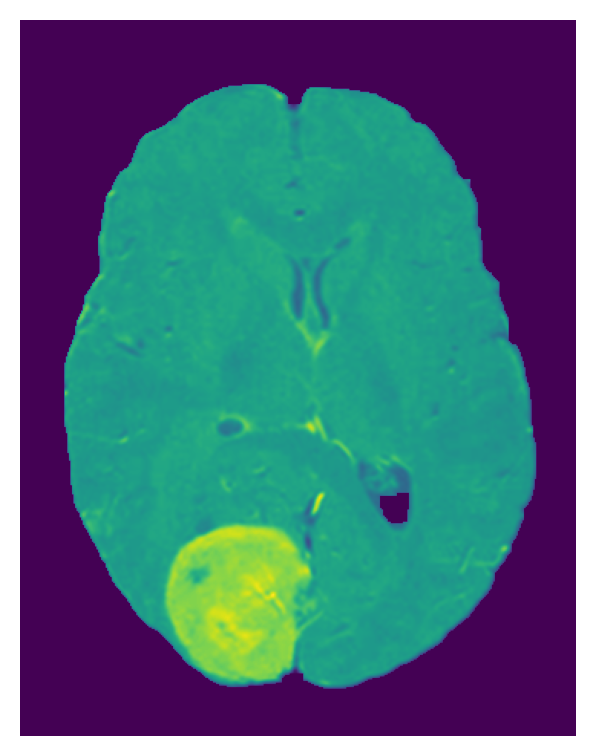

In [36]:
#final result
plt.figure(figsize=(8, 4))
plt.imshow(cropped_image, cmap="gray")
plt.axis("off")
plt.tight_layout()
plt.show()
plt.figure(figsize=(8, 4))
plt.imshow(brain_image)
plt.axis("off")
plt.tight_layout()
plt.show()
plt.imsave("C:\\Users\\22211\\Documents\\BT-dataset2\\MRI Image Dataset for Brain Tumor\\Training\\meningioma\\1.jpg", brain_image)

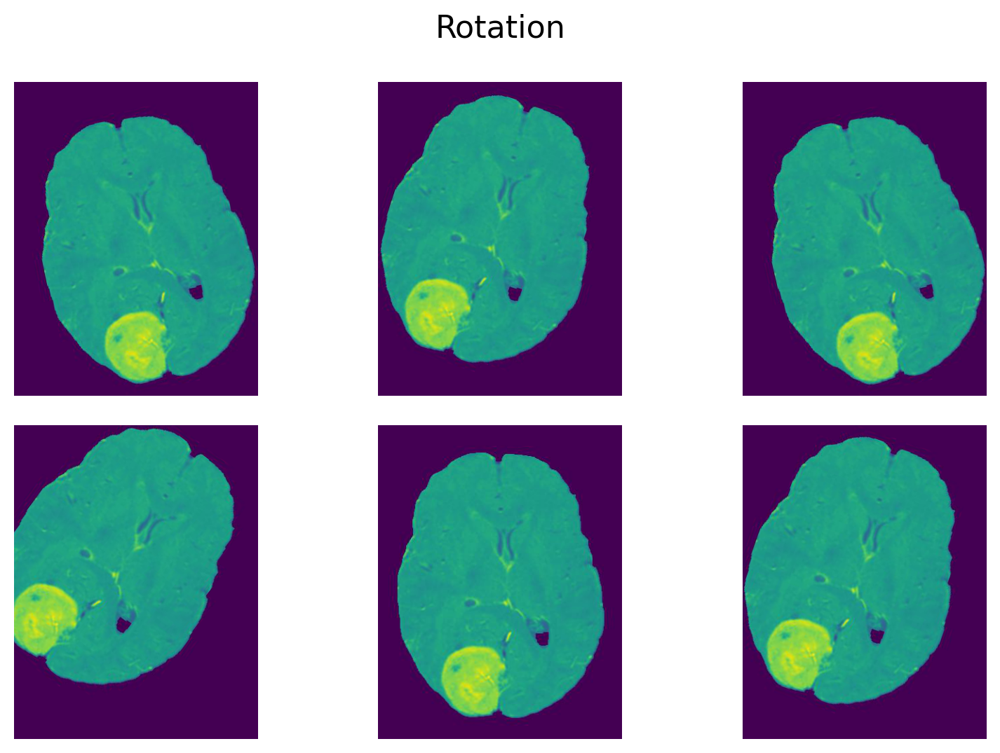

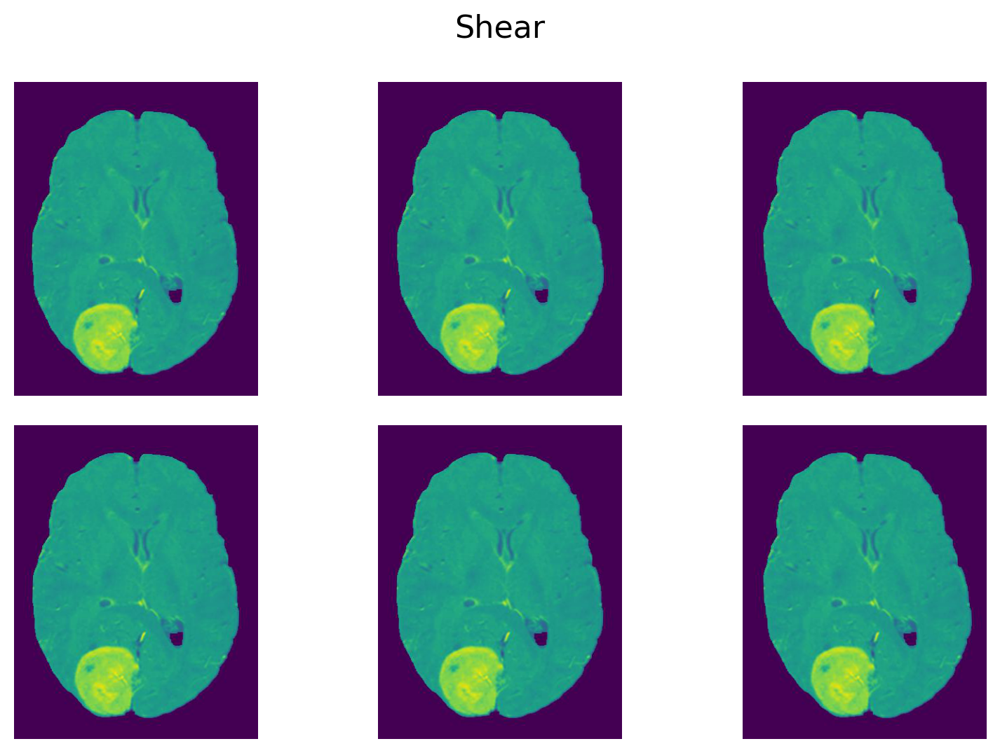

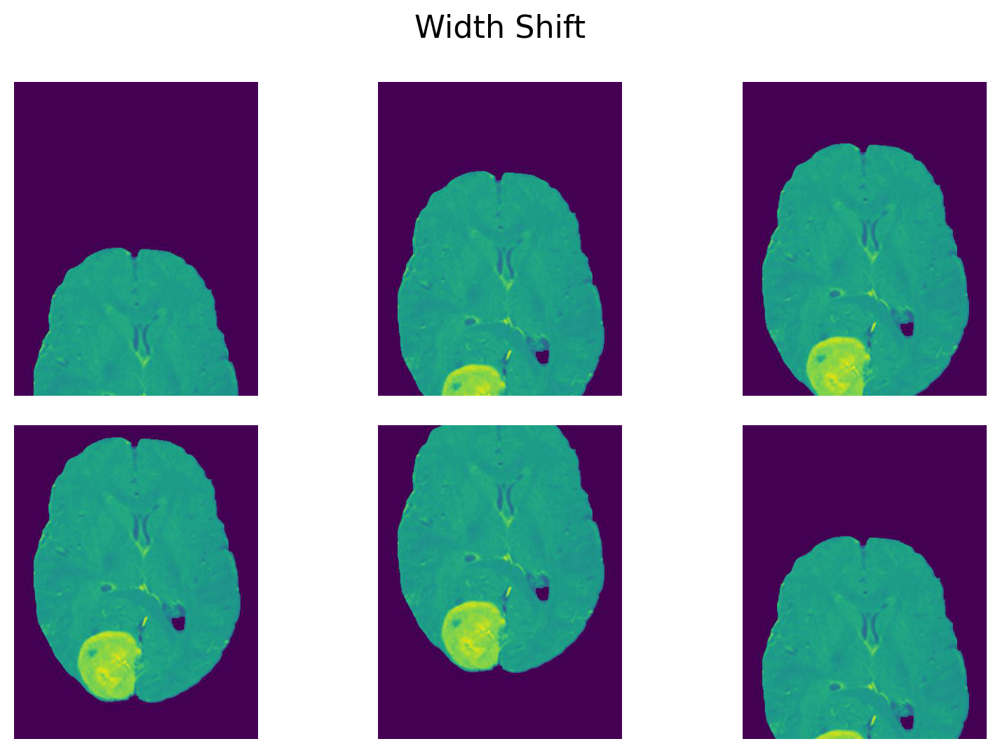

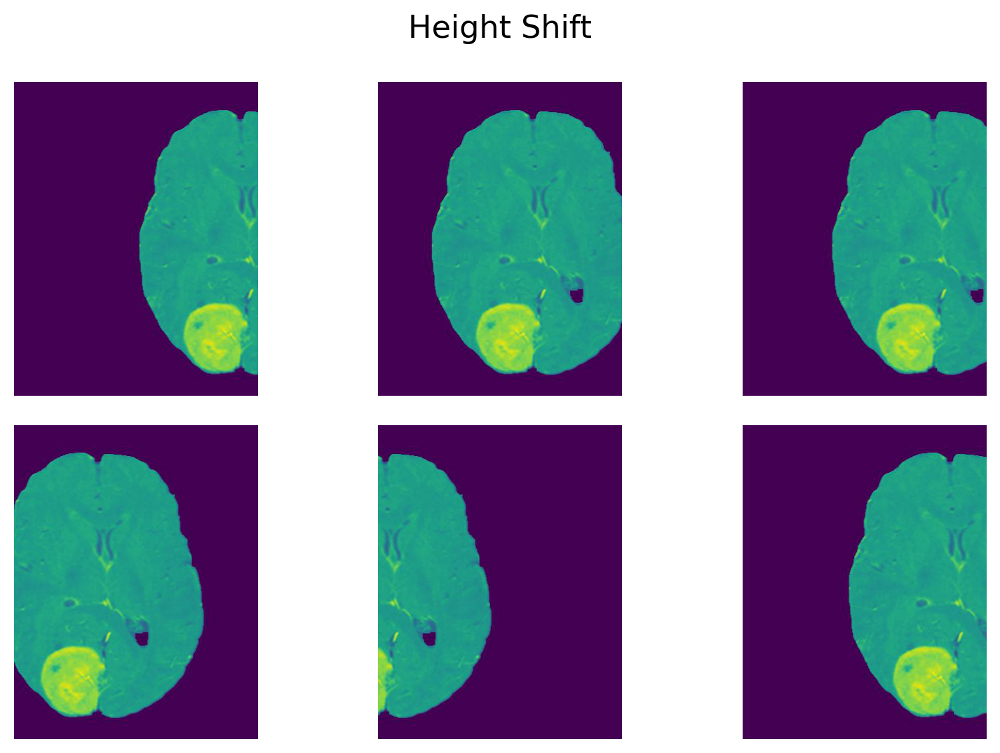

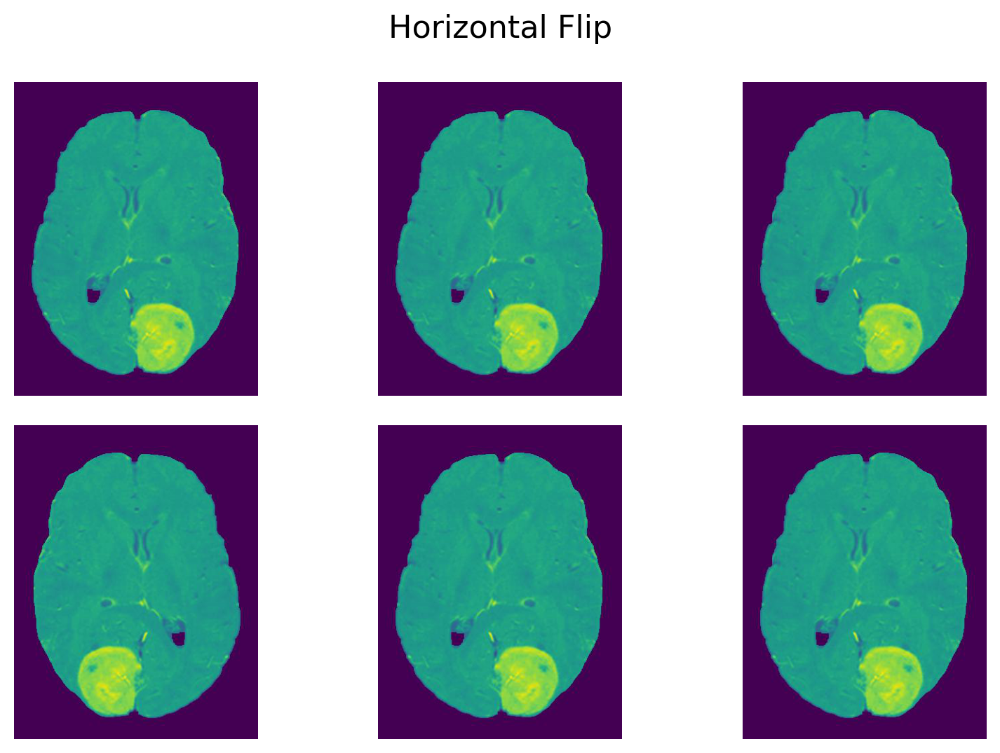

In [37]:
import matplotlib.pyplot as plt
from keras.preprocessing.image import load_img, img_to_array

# Path to the image you want to augment
image_path = 'C:\\Users\\22211\\Documents\\BT-dataset2\\MRI Image Dataset for Brain Tumor\\Training\\meningioma\\1.jpg'  # Update with your image path

# Load the image
img = load_img(image_path)
img_array = img_to_array(img)
img_array = img_array.reshape((1,) + img_array.shape)  # Reshape to (1, height, width, channels)

# Define ImageDataGenerators with different augmentation settings
datagen_rotation = ImageDataGenerator(rotation_range=45)
datagen_width_shift = ImageDataGenerator(width_shift_range=0.6)
datagen_height_shift = ImageDataGenerator(height_shift_range=0.4)
datagen_shear = ImageDataGenerator(shear_range=2)
datagen_flip = ImageDataGenerator(horizontal_flip=True)

data_generators = [datagen_rotation, datagen_shear, datagen_width_shift, datagen_height_shift, datagen_flip]
attributes = ['Rotation', 'Shear', 'Width Shift', 'Height Shift', 'Horizontal Flip']

for i, datagen in enumerate(data_generators):
    augmented_images = []
    plt.figure(figsize=(8, 8))
    plt.suptitle(attributes[i], fontsize=16)
    
    generator = datagen.flow(img_array, batch_size=1)
    for j in range(6):
        batch = next(generator)  # Use next() to get the next batch
        augmented_images.append(batch[0].astype('uint8'))
        plt.subplot(3, 3, j + 1)
        plt.imshow(batch[0].astype('uint8'))
        plt.axis('off')
    
    plt.tight_layout()
    plt.show()

In [38]:
def prepare_the_datasets(train_dataframe, valid_dataframe, x_columns, y_column, batch_size, image_size):  
    # Define parameters for ImageDataGenerator for train and validation
    train_image_data_generator = ImageDataGenerator(
        rescale=1./255,  # Rescale pixel values to [0,1]
        rotation_range=20,
        width_shift_range=0.2,
        height_shift_range=0.2,
        shear_range=0.2,
        zoom_range=0.2,
        horizontal_flip=True,
        fill_mode="nearest"
    )

    val_image_data_generator = ImageDataGenerator(
        rescale=1./255  # Rescale pixel values to [0,1]
    )

    # Create image data generators for train and validation
    train_generator = train_image_data_generator.flow_from_dataframe(
        batch_size=batch_size,
        dataframe=train_dataframe,
        shuffle=True,
        x_col=x_columns,
        y_col=y_column,
        target_size=(image_size, image_size),  # Set the target size for images
        class_mode='categorical'  # For categorical labels
    )

    val_generator = val_image_data_generator.flow_from_dataframe(
        batch_size=batch_size,
        dataframe=valid_dataframe,
        shuffle=True,
        x_col=x_columns,
        y_col=y_column,
        target_size=(image_size, image_size),  # Set the target size for images
        class_mode='categorical'  # For categorical labels
    )
    return train_generator, val_generator

In [39]:
train_dataframe = training
valid_dataframe = testing
x_columns = 'file'
y_column = 'category'
batch_size = 64
image_size = 224

train_data_gen, validation_data_gen = prepare_the_datasets(train_dataframe, valid_dataframe, x_columns, y_column, batch_size, image_size)

Found 5284 validated image filenames belonging to 4 classes.
Found 1311 validated image filenames belonging to 4 classes.


In [45]:
model_vgg_19 = VGG19(
    include_top=True,
    weights="imagenet",
    input_tensor=None,
    input_shape=None,
    pooling=None,
    classes=1000,
    classifier_activation="softmax",
)

In [46]:
# Freeze the convolutional layers to prevent them from being trained
for layer in model_vgg_19.layers:
    layer.trainable = True

In [47]:
x = model_vgg_19.output
#make the input of VGG19 model in higher dimension to single dimension
#x = Flatten()(x)
#fully connected layers
x = Dense(2028, activation='relu')(x)
#normalization
x = BatchNormalization()(x)
x = Dropout(0.3)(x)
x = Dense(1024, activation='relu')(x)
x = BatchNormalization()(x)
x = Dropout(0.3)(x)
output = Dense(4, activation='softmax')(x) 

In [48]:
#final model
model = Model(inputs = model_vgg_19.input, outputs = output)
model.summary()

Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)        │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv1 (Conv2D)           │ (None, 224, 224, 64)   │         1,792 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv2 (Conv2D)           │ (None, 224, 224, 64)   │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_pool (MaxPooling2D)      │ (None, 112, 112, 64)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv1 (Conv2D)           │ (None, 112, 112, 128)  │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv2 (Conv2D)           │ (None, 112, 112, 128)  │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_pool (MaxPooling2D)      │ (None, 56, 56, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv1 (Conv2D)           │ (None, 56, 56, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv2 (Conv2D)           │ (None, 56, 56, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv3 (Conv2D)           │ (None, 56, 56, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv4 (Conv2D)           │ (None, 56, 56, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_pool (MaxPooling2D)      │ (None, 28, 28, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv1 (Conv2D)           │ (None, 28, 28, 512)    │     1,180,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv2 (Conv2D)           │ (None, 28, 28, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv3 (Conv2D)           │ (None, 28, 28, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv4 (Conv2D)           │ (None, 28, 28, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_pool (MaxPooling2D)      │ (None, 14, 14, 512)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv1 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv2 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv3 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv4 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_pool (MaxPooling2D)      │ (None, 7, 7, 512)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 25088)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ fc1 (Dense)                     │ (None, 4096)           │   102,764,544 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ fc2 (Dense)                     │ (None, 4096)           │    16,781,31

 Total params: 147,791,272 (563.78 MB)

 Trainable params: 147,785,168 (563.76 MB)

 Non-trainable params: 6,104 (23.84 KB)

In [49]:
#compile Model
model.compile(loss='categorical_crossentropy',
              optimizer =optimizers.Adam(learning_rate=5e-5),run_eagerly=True,
              metrics=["accuracy"])
    
#.h5 = Hierarchical Data Format Ver. 5 file, verbose =1, to see execution
tensorboard= TensorBoard(log_dir="logs")
checkpoint= ModelCheckpoint("vgg19_model2.keras",
                           monitor="val_accuracy", verbose=1,
                           mode="auto", save_best_only=True)
#monitor: quantity to be monitored.     
#factor: factor by which the learning rate will be reduced. 
#patience: number of epochs with no improvement after which learning rate will be reduced.     
#verbose: int. 0: quiet, 1: update messages.
#min_delta: early stopping of epochs
#cooldown: number of epochs to wait before resuming normal operation after
reduce_lr=ReduceLROnPlateau(monitor="val_accuracy",
                           factor=0.3,
                           patience=2,verbose=1,
                           mode="auto") #lr dropping difference
from keras.callbacks import LearningRateScheduler

def schedule(epoch):
    learning_rate = 0.001
    if epoch < 5:
        learning_rate *= 0.2
    return learning_rate

In [79]:
# Calculate steps per epoch and validation steps
#train_steps = len(train_data_gen) // batch_size
#validation_steps = len(validation_data_gen) // batch_size
epochs = 30

history = model.fit(train_data_gen,
                    epochs=epochs,
                    steps_per_epoch=60,
                    validation_data=validation_data_gen,
                    callbacks=[tensorboard, checkpoint, reduce_lr]
                    )
                    

Epoch 1/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 26s/step - accuracy: 0.9827 - loss: 0.0455 
Epoch 1: val_accuracy did not improve from 0.98551
60/60 ━━━━━━━━━━━━━━━━━━━━ 1671s 28s/step - accuracy: 0.9827 - loss: 0.0455 - val_accuracy: 0.9344 - val_loss: 0.2518 - learning_rate: 4.5000e-06
Epoch 2/30
23/60 ━━━━━━━━━━━━━━━━━━━━ 14:00 23s/step - accuracy: 0.9936 - loss: 0.0374

c:\ProgramData\anaconda3\Lib\contextlib.py:158: UserWarning:

Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.




Epoch 2: val_accuracy did not improve from 0.98551
60/60 ━━━━━━━━━━━━━━━━━━━━ 644s 10s/step - accuracy: 0.9920 - loss: 0.0417 - val_accuracy: 0.9596 - val_loss: 0.1800 - learning_rate: 4.5000e-06
Epoch 3/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 26s/step - accuracy: 0.9838 - loss: 0.0400 

In [52]:
train_score= model.evaluate(train_data_gen)
print("\nWe have training loss {:.3f}% and training accuracy {:.3f}% after evaluation."
      .format(train_score[0], train_score[1]*100))

83/83 ━━━━━━━━━━━━━━━━━━━━ 450s 5s/step - accuracy: 0.9910 - loss: 0.0326

We have training loss 0.029% and training accuracy 99.111% after evaluation.


In [53]:
val_score= model.evaluate(validation_data_gen)
print("\nWe have validation loss {:.3f} and validation accuracy {:.3f}% after evaluation."
      .format(val_score[0], val_score[1]*100))

21/21 ━━━━━━━━━━━━━━━━━━━━ 108s 5s/step - accuracy: 0.9818 - loss: 0.0664

We have validation loss 0.073 and validation accuracy 97.941% after evaluation.


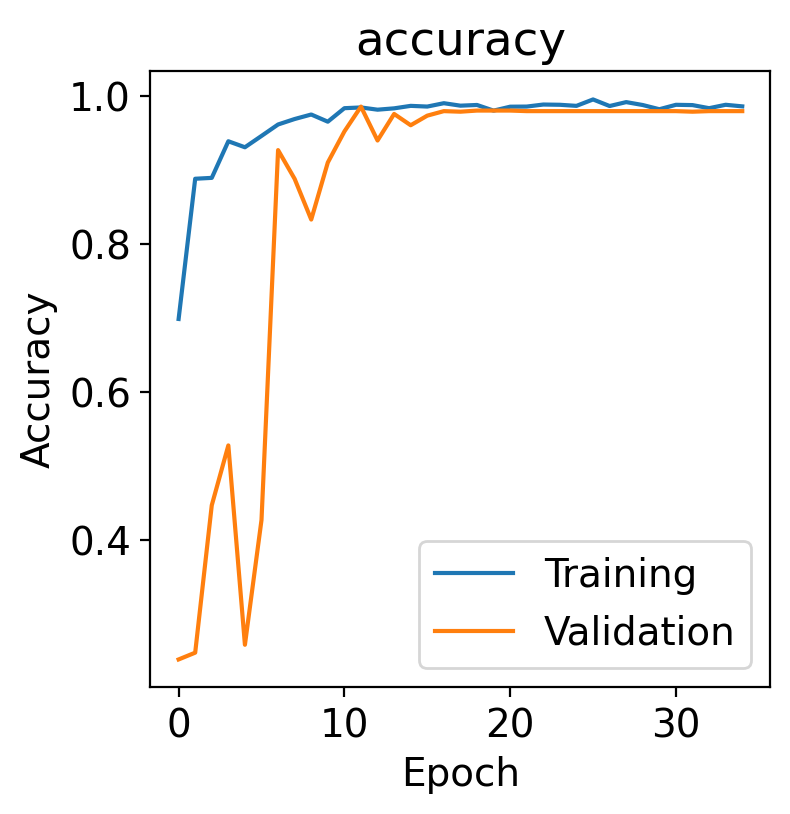

In [54]:
# Visualization
def plot_acc(history, title="accuracy"):
    fig = plt.figure(figsize=(4,4))
    plt.plot(history.history['accuracy'])
    plt.plot(history.history['val_accuracy'])
    plt.title(title)
    plt.ylabel('Accuracy')
    plt.xlabel('Epoch')
    plt.legend(['Training', 'Validation'], loc=0)

plot_acc(history)


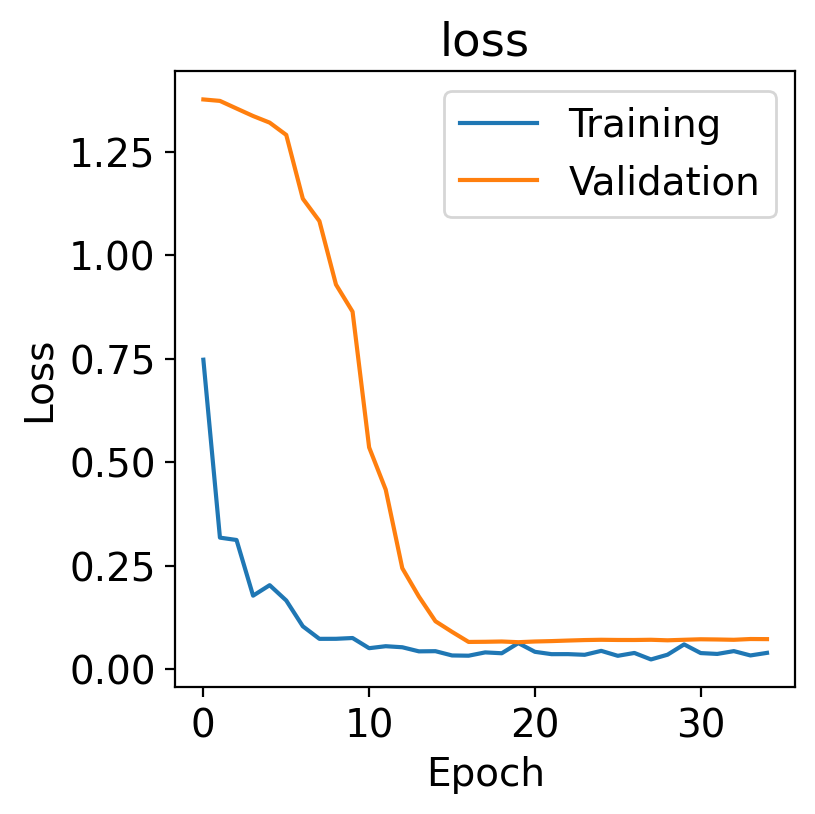

In [55]:
def plot_loss(history, title="loss"):
    fig = plt.figure(figsize=(4,4))
    plt.plot(history.history['loss'])
    plt.plot(history.history['val_loss'])
    plt.title(title)
    plt.ylabel('Loss')
    plt.xlabel('Epoch')
    plt.legend(['Training', 'Validation'], loc=1)

plot_loss(history)

In [76]:
def plot_loss(history, title="Learning Rate Measurements"):
    fig = plt.figure(figsize=(4,4))
    plt.plot(history.history['lr'])
    plt.title(title)
    plt.xlabel("No of Epochs")
    plt.ylabel("Learning Rate")
    plt.legend()
plot_loss(history)

KeyError: 'lr'

<Figure size 400x400 with 0 Axes>

In [57]:
def prepare_test_data(test_dataframe, x_columns, batch_size, image_size):  
    # Define parameters for ImageDataGenerator for train and validation

    test_image_data_generator = ImageDataGenerator(
        rescale=1./255  # Rescale pixel values to [0,1]
    )
    
    test_generator = test_image_data_generator.flow_from_dataframe(
        batch_size=batch_size,
        dataframe=test_dataframe,
        shuffle=False,
        x_col=x_columns,
        y_col=None,
        target_size=(image_size, image_size),  # Set the target size for images
        class_mode=None  # For categorical labels
    )
    return test_generator

In [58]:
#testing columns details
testing.columns

Index(['file', 'category_id', 'category'], dtype='object')

In [59]:
#test images preprocessing
test_processed_images = prepare_test_data(validing,'file', 32, 224)

Found 655 validated image filenames.


In [62]:
# Make predictions for images using the model
predictions = model.predict(test_processed_images, steps=len(testing) // 32 + 1)

41/41 ━━━━━━━━━━━━━━━━━━━━ 65s 2s/step 


In [63]:
predicted_classes = np.argmax(predictions, axis=1)
predicted_classes

array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 3, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1,
       1, 1, 1, 3, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 3, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 3, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 3, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 3, 1, 1,
       1, 1, 3, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 3,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,

In [64]:
#testing dataset to create new dataframe
target_and_predict = validing.copy()

In [65]:
#add column for predicted value
target_and_predict['predicted_classes'] = predicted_classes

In [66]:
#target_and_predict dataframe
target_and_predict

,file,category_id,category,predicted_classes
0,C:\Users\22211\Documents\BT-dataset2\MRI Image...,0,glioma,0
1,C:\Users\22211\Documents\BT-dataset2\MRI Image...,0,glioma,0
2,C:\Users\22211\Documents\BT-dataset2\MRI Image...,0,glioma,0
3,C:\Users\22211\Documents\BT-dataset2\MRI Image...,0,glioma,0
4,C:\Users\22211\Documents\BT-dataset2\MRI Image...,0,glioma,0
...,...,...,...,...
650,C:\Users\22211\Documents\BT-dataset2\MRI Image...,3,pituitary,3
651,C:\Users\22211\Documents\BT-dataset2\MRI Image...,3,pituitary,3
652,C:\Users\22211\Documents\BT-dataset2\MRI Image...,3,pituitary,3
653,C:\Users\22211\Documents\BT-dataset2\MRI Image...,3,pituitary,3


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step
Tumor present: yes
Predicted class: meningioma
Tumor location: (array([0.10646704, 0.43836504, 0.3547411 , 0.10042683], dtype=float32), array([0.10646704, 0.43836504, 0.3547411 , 0.10042683], dtype=float32))


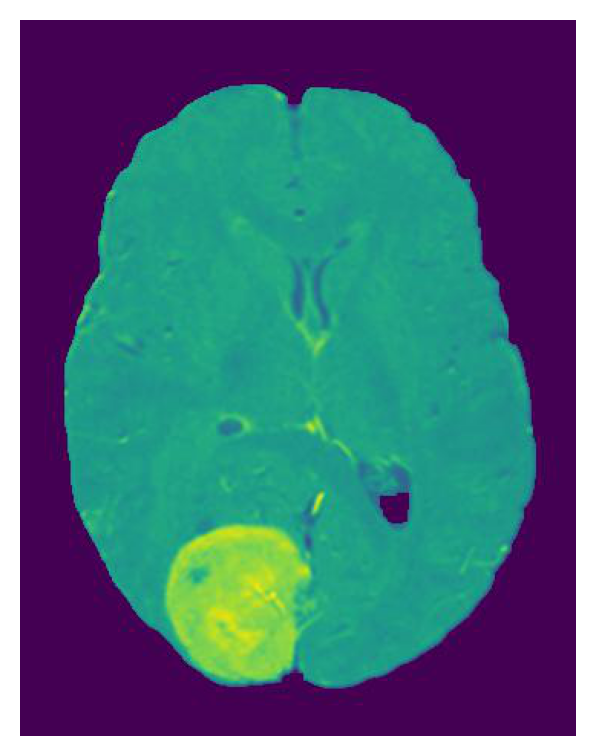

In [67]:
from tensorflow.keras.models import load_model

# Load the pre-trained model
model = load_model('vgg19_model2.keras')

# Function to predict tumor presence, type, and location
def predict_tumor(img):
    # Load and preprocess the input image
    img = cv2.imread(img)
    if img is None:
        print("Error: Unable to load image at", image_path)
        return None, None
    
    img = cv2.resize(img, (224, 224))  # Resize to match model input size
    img = np.expand_dims(img, axis=0)  # Add batch dimension
    img = img / 255.0  # Normalize pixel values

    # Make prediction
    prediction = model.predict(img)

    # Decode prediction
    class_labels = ["glioma", "meningioma", "notumor", "pituitary"]
    predicted_class_index = np.argmax(prediction)
    predicted_class = class_labels[predicted_class_index]

    # Determine tumor presence
    tumor_present = "yes" if predicted_class != "notumor" else "no"

    # Post-process location (You may need to adjust this based on your model output)
    # Assuming the model outputs the coordinates of the tumor location
    # Extracting coordinates from prediction (example)
    tumor_location = (prediction[0], prediction[0])  # Example coordinates

    return tumor_present, predicted_class, tumor_location

# Example usage
image_path = 'C:\\Users\\22211\\Documents\\BT-dataset2\\MRI Image Dataset for Brain Tumor\\Training\\meningioma\\1.jpg'
tumor_present, predicted_class, tumor_location = predict_tumor(image_path)
if predicted_class is not None:
    print("Tumor present:", tumor_present)
    print("Predicted class:", predicted_class)
    print("Tumor location:", tumor_location)
    img = Image.open(image_path)
    plt.figure(figsize=(8, 4))
    plt.imshow(img)
    plt.axis("off")

plt.tight_layout()
plt.show()

In [68]:
# Calculate accuracy
accuracy = accuracy_score(target_and_predict['category_id'], target_and_predict['predicted_classes'])

print(f"\nWe have test accuracy {accuracy * 100:.4f}% after test images evaluation.")


We have test accuracy 98.6260% after test images evaluation.


In [69]:
# find the column with unique values
unique_values = target_and_predict['category_id'].unique()

result = target_and_predict.groupby('category_id').first()
result

,file,category,predicted_classes
category_id,,,
0,C:\Users\22211\Documents\BT-dataset2\MRI Image...,glioma,0
1,C:\Users\22211\Documents\BT-dataset2\MRI Image...,meningioma,1
2,C:\Users\22211\Documents\BT-dataset2\MRI Image...,notumor,2
3,C:\Users\22211\Documents\BT-dataset2\MRI Image...,pituitary,3


In [70]:
result['category']

category_id
0        glioma
1    meningioma
2       notumor
3     pituitary
Name: category, dtype: object

In [71]:
# Replace these with your actual column names
category_id_column = 'category_id'
predicted_classes_column = 'predicted_classes'
category_name_column = 'category'

# Create a mapping dictionary from category_id to category_name
id_to_name_mapping = dict(zip(target_and_predict[category_id_column], target_and_predict[category_name_column]))
print(f"id_to_name_mapping:\n{id_to_name_mapping}")
# Replace numeric values in 'category_id' and 'predicted_classes' columns with their names
target_and_predict['category_id'] = target_and_predict['category_id'].map(id_to_name_mapping)
target_and_predict['predicted_classes'] = target_and_predict['predicted_classes'].map(id_to_name_mapping)

# Generate classification report with names instead of numeric values
report = classification_report(
    target_and_predict['category_id'],
    target_and_predict['predicted_classes']
)

print(report)

id_to_name_mapping:
{0: 'glioma', 1: 'meningioma', 2: 'notumor', 3: 'pituitary'}
              precision    recall  f1-score   support

      glioma       1.00      0.99      1.00       175
  meningioma       1.00      0.94      0.97       139
     notumor       1.00      1.00      1.00       162
   pituitary       0.95      1.00      0.98       179

    accuracy                           0.99       655
   macro avg       0.99      0.98      0.99       655
weighted avg       0.99      0.99      0.99       655



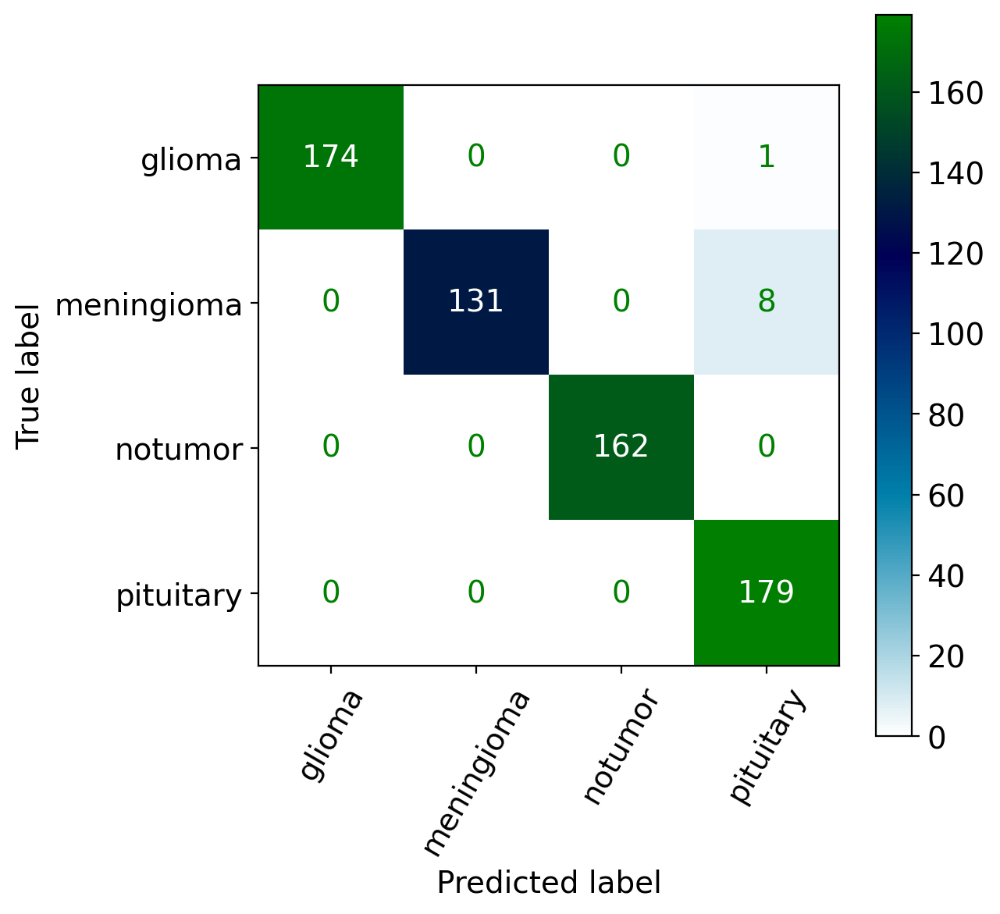

In [72]:
# Generate confusion matrix
conf_matrix = confusion_matrix(
    target_and_predict['category_id'],
    target_and_predict['predicted_classes']
)

# Plot confusion matrix
disp = ConfusionMatrixDisplay(confusion_matrix=conf_matrix, display_labels=list(id_to_name_mapping.values()))
fig, ax = plt.subplots(figsize=(6, 6))
disp.plot(cmap='ocean_r',ax=ax,xticks_rotation=60)
plt.show()


C:\Users\22211\AppData\Local\Temp\ipykernel_5244\1758348707.py:31: UserWarning:

This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.



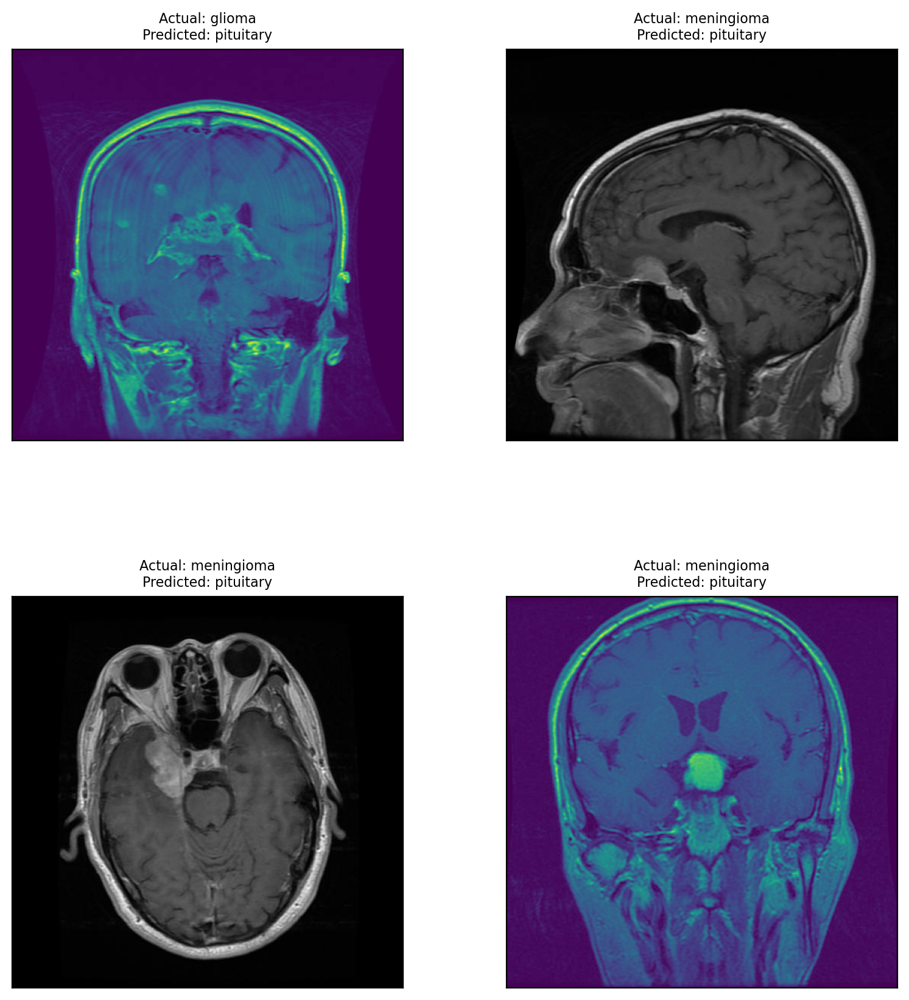

In [77]:
# Replace these with your actual column names
image_path_column = 'file'
category_id_column = 'category_id'
predicted_classes_column = 'predicted_classes'
num_images_to_display = 4

# Filter misclassified samples from the DataFrame
misclassified = target_and_predict[target_and_predict[category_id_column] != target_and_predict[predicted_classes_column]]

# Load and display misclassified images with label
# Number of misclassified images to display (adjust as needed)
num_cols = 2  # Number of columns in the grid
num_rows = (num_images_to_display + num_cols - 1) // num_cols  # Calculate number of rows needed

fig = plt.figure(figsize=(10, 10))
gs = gridspec.GridSpec(num_rows, num_cols)
gs.update(wspace=0.1, hspace=0.4)

for i, (_, row) in enumerate(misclassified.head(num_images_to_display).iterrows()):
    img_path = row[image_path_column]
    actual_label = row[category_id_column]
    predicted_label = row[predicted_classes_column]

    img = Image.open(img_path)
    ax = plt.subplot(gs[i % num_rows, i // num_rows])
    ax.imshow(img)
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_title(f'Actual: {actual_label}\nPredicted: {predicted_label}', fontsize=8)

plt.tight_layout()
plt.show()

In [78]:
# Replace these with your actual column names
image_path_column = 'file'
category_id_column = 'category_id'
predicted_classes_column = 'predicted_classes'

# Filter misclassified samples and extract indices with corresponding image paths
misclassified_samples = target_and_predict[target_and_predict[category_id_column] != target_and_predict[predicted_classes_column]]
misclassified_indices_with_image_paths = misclassified_samples[[image_path_column, category_id_column, predicted_classes_column]]

print("Misclassified Samples with Image Paths:")
misclassified_indices_with_image_paths

Misclassified Samples with Image Paths:


,file,category_id,predicted_classes
157,C:\Users\22211\Documents\BT-dataset2\MRI Image...,glioma,pituitary
179,C:\Users\22211\Documents\BT-dataset2\MRI Image...,meningioma,pituitary
223,C:\Users\22211\Documents\BT-dataset2\MRI Image...,meningioma,pituitary
234,C:\Users\22211\Documents\BT-dataset2\MRI Image...,meningioma,pituitary
248,C:\Users\22211\Documents\BT-dataset2\MRI Image...,meningioma,pituitary
261,C:\Users\22211\Documents\BT-dataset2\MRI Image...,meningioma,pituitary
266,C:\Users\22211\Documents\BT-dataset2\MRI Image...,meningioma,pituitary
285,C:\Users\22211\Documents\BT-dataset2\MRI Image...,meningioma,pituitary
311,C:\Users\22211\Documents\BT-dataset2\MRI Image...,meningioma,pituitary


In [76]:
!git clone https://github.com/matterport/Mask_RCNN.git

Cloning into 'Mask_RCNN'...


In [77]:
import os
os.chdir('C:\\xampp\\htdocs\\register\\Mask_RCNN')

In [78]:
import subprocess
subprocess.run(['curl', '-o', 'mask_rcnn_coco.h5', 'https://github.com/matterport/Mask_RCNN/releases/download/v2.1/mask_rcnn_coco.h5'])

CompletedProcess(args=['curl', '-o', 'mask_rcnn_coco.h5', 'https://github.com/matterport/Mask_RCNN/releases/download/v2.1/mask_rcnn_coco.h5'], returncode=0)

In [79]:
# Importing libraries
import os
import re
import sys
import cv2
import glob 
import time
import json
import math
import random
import imutils
import itertools
import matplotlib
import numpy as np # linear algebra
import skimage.draw
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
from PIL import Image
from tqdm import tqdm
import matplotlib.cm as cm
from skimage.io import imread
import matplotlib.pyplot as plt
import PIL.ImageDraw as ImageDraw
from imgaug import augmenters as iaa
import keras

from IPython.display import clear_output

!git clone https://github.com/matterport/Mask_RCNN.git # load Mask R-CNN code implementation
!git clone https://github.com/rastislavkopal/brain-tumor-segmentation.git # load manually annotated data from git repo
# !git clone -b activation https://github.com/sumanpanda1997/image_segmentation    
    
!rm -rf brain-tumor-segmentation/.git/
!rm -rf Mask_RCNN/.git/

clear_output()

In [93]:
import os
import sys

# Root directory of the project
ROOT_DIR = os.path.abspath("C:\\xampp\\htdocs\\register\\Mask_RCNN")

# Import Mask RCNN
sys.path.append(ROOT_DIR)  # To find local version of the library
from mrcnn.config import Config
from mrcnn import utils
import mrcnn.model as modellib
from mrcnn import visualize
from mrcnn.model import log

%matplotlib inline 

# Directory to save logs and trained model
MODEL_DIR = os.path.join(ROOT_DIR, "logs")
DEFAULT_LOGS_DIR = 'logs'

clear_output()
print("Setup complete")


Setup complete


In [105]:
!pip install pycocotools
# Local path to trained weights file
COCO_MODEL_PATH = os.path.join(ROOT_DIR, "mask_rcnn_coco.h5")

# Download COCO trained weights from Releases if needed
if not os.path.exists(COCO_MODEL_PATH):
    utils.download_trained_weights(COCO_MODEL_PATH)

# Import COCO config  
sys.path.append(os.path.join(ROOT_DIR, 'samples/coco/'))
import coco

plt.rcParams['figure.facecolor'] = 'white'

DATASET_DIR = 'C:\\Users\\22211\\Documents\\BT-dataset2\\MRI Image Dataset for Brain Tumor'
    
clear_output()

In [1]:
# We load a few images from the train directory of the dataset

examples = [Image.open(DATASET_DIR + 'c:\\Users\\22211\\Documents\\BT-dataset2\\MRI Image Dataset for Brain Tumor\\Training\\meningioma\\Tr-me_0012.jpg'),Image.open(DATASET_DIR + 'c:\\Users\\22211\\Documents\\BT-dataset2\\MRI Image Dataset for Brain Tumor\\Training\\meningioma\\Tr-me_0060.jpg'),Image.open(DATASET_DIR+'c:\\Users\\22211\\Documents\\BT-dataset2\\MRI Image Dataset for Brain Tumor\\Training\\meningioma\\Tr-me_0047.jpg')]
examplesSeg = ['meningioma\\Tr-me_0012.jpg17751','meningioma\\Tr-me_0060.jpg17413','meningioma\\Tr-me_0047.jpg29545']

## print some example images from train directory
fig = plt.figure(figsize=(10,14))

for i in range(0, len(examples)):
    a = fig.add_subplot(1, 3, i+1)
    imgplot = plt.imshow(examples[i])
    a.set_title('Example '+str(i))

## print segment examples for images from json annotations file
with open(DATASET_DIR+'Training/annotations.json') as json_file:
    data = json.load(json_file)
    for i in range(0,len(examplesSeg)):
        # load regions from json file and transform them into (x,y) coordinates
        coord = list(zip(data[examplesSeg[i]]['regions'][0]['shape_attributes']['all_points_x'],data[examplesSeg[i]]['regions'][0]['shape_attributes']['all_points_y'])) 
        image = Image.new("RGB", np.asarray(examples[i]).shape[0:2])
        draw = ImageDraw.Draw(image)
        draw.polygon((coord), fill=200)
        a = fig.add_subplot(2, 3, 3+i+1)
        imgplot = plt.imshow(image)
        a.set_title('Segment for example ' + str(i))

NameError: name 'Image' is not defined

In [108]:
# Configurations
class BrainTumorConfig(Config):
    """Configuration for training on the brain tumor segmentation dataset.
    Derives from the base Config class and overrides values specific
    to the brain tumor segmentation dataset.
    """
    # Give the configuration a recognizable name
    NAME = "brain_tumor"

    # Adjust depending on your GPU memory
    IMAGES_PER_GPU = 1

    # Number of classes (including background)
    NUM_CLASSES = 1 + 1  # Background + brain tumor

    # Number of training steps per epoch
    STEPS_PER_EPOCH = 8

    # Skip detections with < 90% confidence
    DETECTION_MIN_CONFIDENCE = 0.9

config = BrainTumorConfig()
config.display()


Configurations:
BACKBONE                       resnet101
BACKBONE_STRIDES               [4, 8, 16, 32, 64]
BATCH_SIZE                     1
BBOX_STD_DEV                   [0.1 0.1 0.2 0.2]
COMPUTE_BACKBONE_SHAPE         None
DETECTION_MAX_INSTANCES        100
DETECTION_MIN_CONFIDENCE       0.9
DETECTION_NMS_THRESHOLD        0.3
FPN_CLASSIF_FC_LAYERS_SIZE     1024
GPU_COUNT                      1
GRADIENT_CLIP_NORM             5.0
IMAGES_PER_GPU                 1
IMAGE_CHANNEL_COUNT            3
IMAGE_MAX_DIM                  1024
IMAGE_META_SIZE                14
IMAGE_MIN_DIM                  800
IMAGE_MIN_SCALE                0
IMAGE_RESIZE_MODE              square
IMAGE_SHAPE                    [1024 1024    3]
LEARNING_MOMENTUM              0.9
LEARNING_RATE                  0.001
LOSS_WEIGHTS                   {'rpn_class_loss': 1.0, 'rpn_bbox_loss': 1.0, 'mrcnn_class_loss': 1.0, 'mrcnn_bbox_loss': 1.0, 'mrcnn_mask_loss': 1.0}
MASK_POOL_SIZE                 14
MASK_SHAPE         

In [126]:
class BrainScanDataset(utils.Dataset):

    def load_brain_scan(self, dataset_dir, subset):
        """Load a subset of the FarmCow dataset.
        dataset_dir: Root directory of the dataset.
        subset: Subset to load: train or val
        """
        # Add classes. We have only one class to add.
        self.add_class("tumor", 1, "tumor")

        # Train or validation dataset?
        assert subset in ["Training", "Validation", 'Testing']
        dataset_dir = os.path.join(dataset_dir, subset)

        annotations = json.load(open(os.path.join(DATASET_DIR, subset, 'annotations'+'.json'+'.txt')))
        annotations = list(annotations.values())  # don't need the dict keys

        # The VIA tool saves images in the JSON even if they don't have any
        # annotations. Skip unannotated images.
        annotations = [a for a in annotations if a['regions']]

        # Add images
        for a in annotations:
            # Get the x, y coordinaets of points of the polygons that make up
            # the outline of each object instance. These are stores in the
            # shape_attributes (see json format above)
            # The if condition is needed to support VIA versions 1.x and 2.x.
            if type(a['regions']) is dict:
                polygons = [r['shape_attributes'] for r in a['regions'].values()]
            else:
                polygons = [r['shape_attributes'] for r in a['regions']]

            # load_mask() needs the image size to convert polygons to masks.
            # Unfortunately, VIA doesn't include it in JSON, so we must read
            # the image. This is only managable since the dataset is tiny.
            image_path = os.path.join(dataset_dir, a['filename'])
            image = skimage.io.imread(image_path)
            height, width = image.shape[:2]

            self.add_image(
                "tumor",
                image_id=a['filename'],  # use file name as a unique image id
                path=image_path,
                width=width, 
                height=height,
                polygons=polygons
            )

    def load_mask(self, image_id):
        """Generate instance masks for an image.
       Returns:
        masks: A bool array of shape [height, width, instance count] with
            one mask per instance.
        class_ids: a 1D array of class IDs of the instance masks.
        """
        # If not a farm_cow dataset image, delegate to parent class.
        image_info = self.image_info[image_id]
        if image_info["source"] != "tumor":
            return super(self.__class__, self).load_mask(image_id)

        # Convert polygons to a bitmap mask of shape
        # [height, width, instance_count]
        info = self.image_info[image_id]
        mask = np.zeros([info["height"], info["width"], len(info["polygons"])],
                        dtype=np.uint8)
        for i, p in enumerate(info["polygons"]):
            # Get indexes of pixels inside the polygon and set them to 1
            rr, cc = skimage.draw.polygon(p['all_points_y'], p['all_points_x'])
            mask[rr, cc, i] = 1

        # Return mask, and array of class IDs of each instance. Since we have
        # one class ID only, we return an array of 1s
        return mask.astype(np.bool), np.ones([mask.shape[-1]], dtype=np.int32)

    def image_reference(self, image_id):
        """Return the path of the image."""
        info = self.image_info[image_id]
        if info["source"] == "tumor":
            return info["path"]
        else:
            super(self.__class__, self).image_reference(image_id)

In [127]:
# Training dataset.
dataset_train = BrainScanDataset()
dataset_train.load_brain_scan(DATASET_DIR, 'Training')
dataset_train.prepare()

# Validation dataset
dataset_val = BrainScanDataset()
dataset_val.load_brain_scan(DATASET_DIR, 'Validation')
dataset_val.prepare()

dataset_test = BrainScanDataset()
dataset_test.load_brain_scan(DATASET_DIR, 'Testing')
dataset_test.prepare()

TypeError: list indices must be integers or slices, not str

In [121]:
warnings.filterwarnings('ignore')

# Create model
model = modellib.MaskRCNN(
    mode='training', 
    config=config, 
    model_dir=DEFAULT_LOGS_DIR
)

# Load weights
model.load_weights(
    COCO_MODEL_PATH, 
    by_name=True, 
    exclude=["mrcnn_class_logits", "mrcnn_bbox_fc", "mrcnn_bbox", "mrcnn_mask"]
)

AttributeError: 'MaskRCNN' object has no attribute 'set_log_dir'